<a href="https://colab.research.google.com/github/akshat2635/auto-eval/blob/main/auto_eval_paddleocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install paddlepaddle-gpu -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.9/758.9 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.5 MB/s eta 0:00:00


In [2]:
!pip install "paddleocr>=2.0.1"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.0/780.0 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 58.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 38.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 87.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 65.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 106.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 34.9 MB/

In [3]:
import os
import shutil
import cv2

import matplotlib.pyplot as plt

import PIL.Image
from PIL import Image

In [4]:
# required modules
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import shutil
import PIL.Image
from PIL import Image

In [5]:
dir="/content/drive/MyDrive/anand_mishra/Train_Samples_V0"
arr=[]
imgs=[]
for root,dirs,files in os.walk(dir):
    for file in files:
        path=dir+"/"+file
        arr.append(path)
        img=cv2.imread(path)
        # img=cv2.resize(img,(1700,2000))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # plt.imshow(img,cmap='gray')
        print(img.shape)
        # break;
        imgs.append(img)

(8042, 6886)
(7981, 6863)
(8067, 6877)
(7923, 6913)
(7929, 6887)
(8160, 6930)
(7996, 6857)
(7789, 6864)
(7821, 6897)
(7955, 6898)
(7825, 6860)
(8059, 6916)
(7812, 6826)
(8026, 6862)
(7865, 6842)
(7881, 6882)
(7888, 6839)
(7831, 6878)
(8076, 6889)
(8099, 6917)
(7796, 6871)
(7763, 6865)
(7838, 6895)
(7911, 6877)
(7826, 6859)
(7804, 6902)
(7980, 6911)
(7924, 6884)


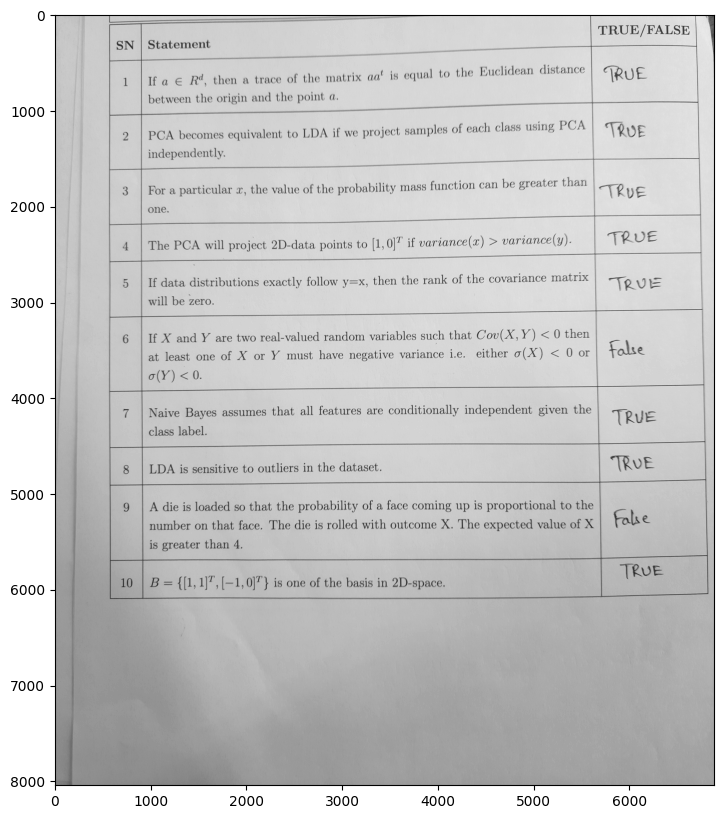

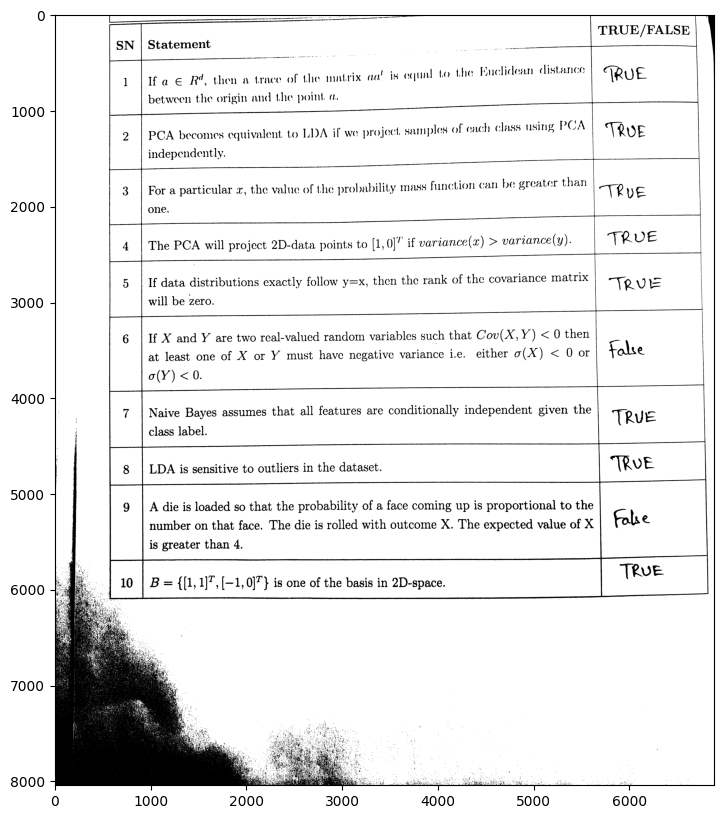

In [6]:
def preprocess_image(img):

    # Apply thresholding to binarize the image
    _, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to enhance the text
    kernel = np.ones((3, 3), np.uint8)
    morphed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

    return morphed_img
plt.figure(figsize = (15,10))
plt.imshow(imgs[0],cmap='gray')
plt.show()
plt.figure(figsize = (15,10))
plt.imshow(preprocess_image(imgs[0]),cmap='gray')

In [7]:

from paddleocr import PaddleOCR,draw_ocr

ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:00<00:00, 6.06MiB/s]


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:06<00:00, 1.66MiB/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:01<00:00, 1.69MiB/s]

[2024/06/05 18:17:56] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=True, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='/

In [23]:
result = ocr.ocr(arr[25], cls=True)

[2024/06/05 18:40:32] ppocr DEBUG: dt_boxes num : 43, elapsed : 0.11931896209716797
[2024/06/05 18:40:33] ppocr DEBUG: cls num  : 43, elapsed : 0.08112835884094238
[2024/06/05 18:40:33] ppocr DEBUG: rec_res num  : 43, elapsed : 0.2664799690246582


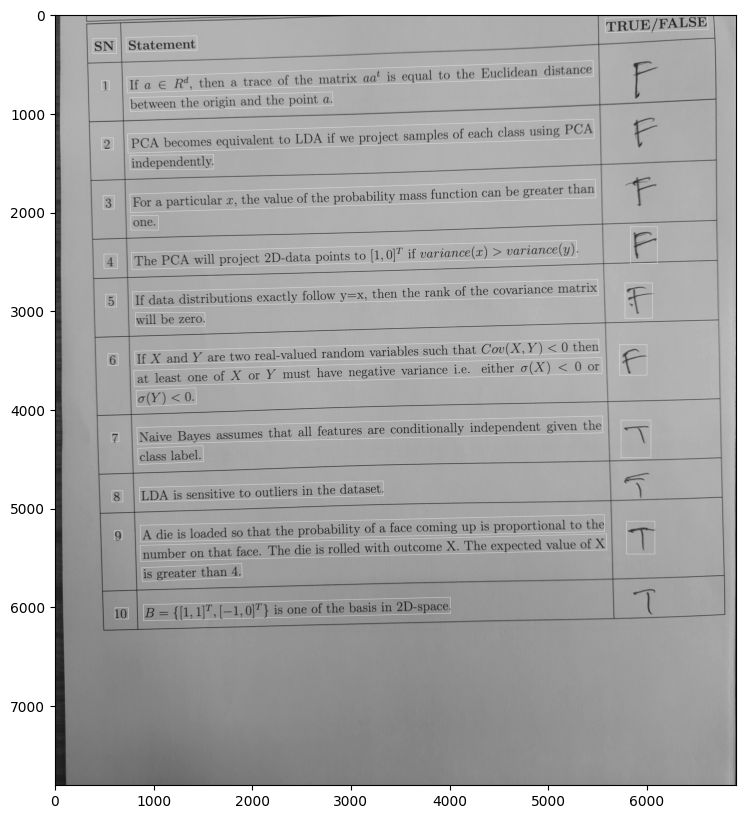

In [24]:
new_result = result[0]

boxes = [line[0] for line in new_result]
txts = [line[1][0] for line in new_result]
scores = [line[1][1] for line in new_result]

image = imgs[25].copy()

im_show = draw_ocr(image, boxes)
im_show = Image.fromarray(im_show)
plt.figure(figsize = (15,10))
plt.imshow(im_show,cmap='gray');

[2024/06/05 18:42:20] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.07639908790588379
[2024/06/05 18:42:21] ppocr DEBUG: cls num  : 42, elapsed : 0.05242729187011719
[2024/06/05 18:42:21] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2474229335784912
['True', 'True', 'True', 'True', 'True', 'False', 'True', 'True', 'False', 'True']


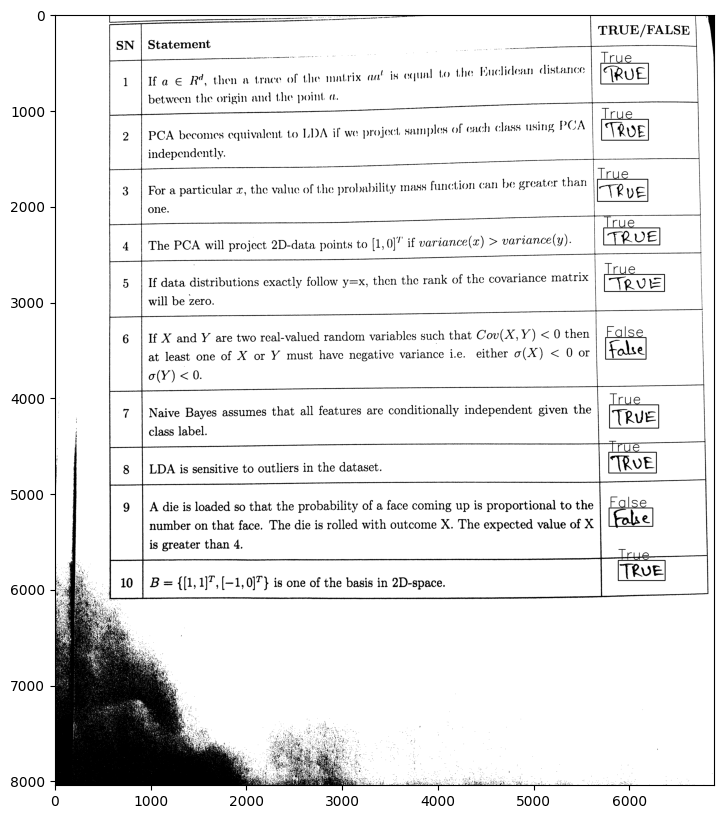

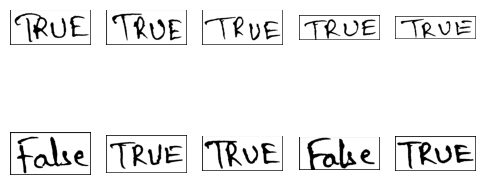

In [26]:
def extract_tf(image1, path):
    image = image1.copy()
    image = preprocess_image(image)

    # Perform text detection and recognition using PaddleOCR
    res = ocr.ocr(path, cls=True)
    res=res[0]

    height, width = image.shape[:2]
    bound = width
    cur = 1
    texts = []
    cropped_images = []

    for line in res:
        bbox=line[0]
        text=line[1][0]
        prob=line[1][1]
        # Unpack the bounding box
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))

        if cur == 1 and ('TRUE' in text):
            bound = tl[0] - 50
            cur = 0
            continue

        if tl[0] > bound:
            if text[0] == 'T' or text[0] == 't':
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image, "True", (tl[0], tl[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('True')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)
            elif text[0] == 'F' or text[0] == 'f':
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image, "False", (tl[0], tl[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('False')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)
            else:
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image, text, (tl[0], tl[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                # texts.append(text)
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)


    return image, cropped_images, texts

def display_images(images):
    n = len(images)
    plt.figure(figsize=(6, 3))
    for i in range(0, min(n, 10)):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
    plt.show()

img,cur,texts=extract_tf(imgs[0],arr[0])
print(texts)
plt.figure(figsize=(10,10))
plt.imshow(img,cmap='gray')
plt.show()
display_images(cur)

1
[2024/06/05 18:42:29] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.05136394500732422
[2024/06/05 18:42:30] ppocr DEBUG: cls num  : 42, elapsed : 0.04992485046386719
[2024/06/05 18:42:30] ppocr DEBUG: rec_res num  : 42, elapsed : 0.25567078590393066


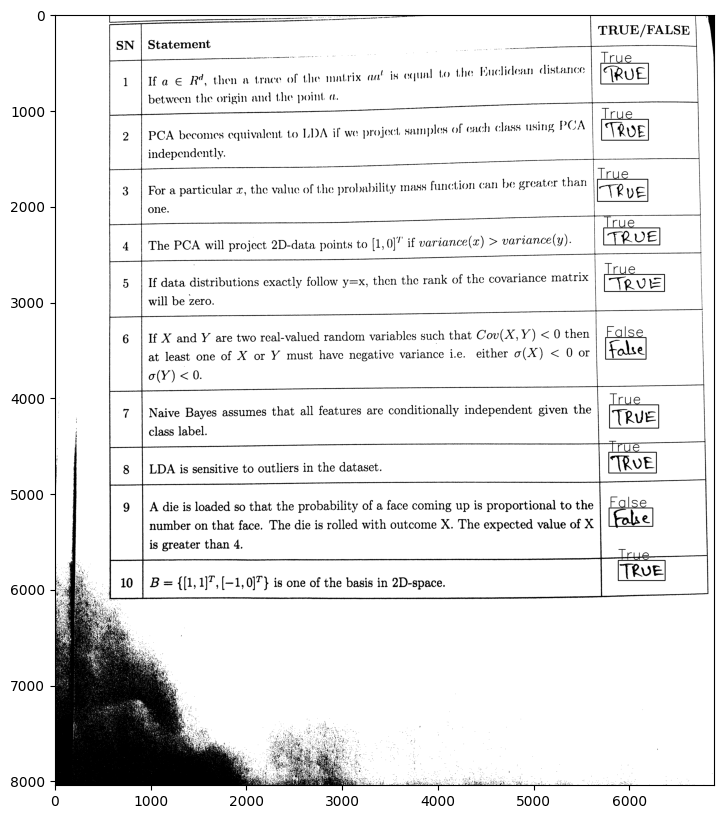

10 ['True', 'True', 'True', 'True', 'True', 'False', 'True', 'True', 'False', 'True']


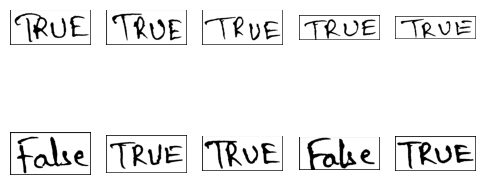

2
[2024/06/05 18:42:34] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.06552839279174805
[2024/06/05 18:42:35] ppocr DEBUG: cls num  : 42, elapsed : 0.045990705490112305
[2024/06/05 18:42:35] ppocr DEBUG: rec_res num  : 42, elapsed : 0.23697638511657715


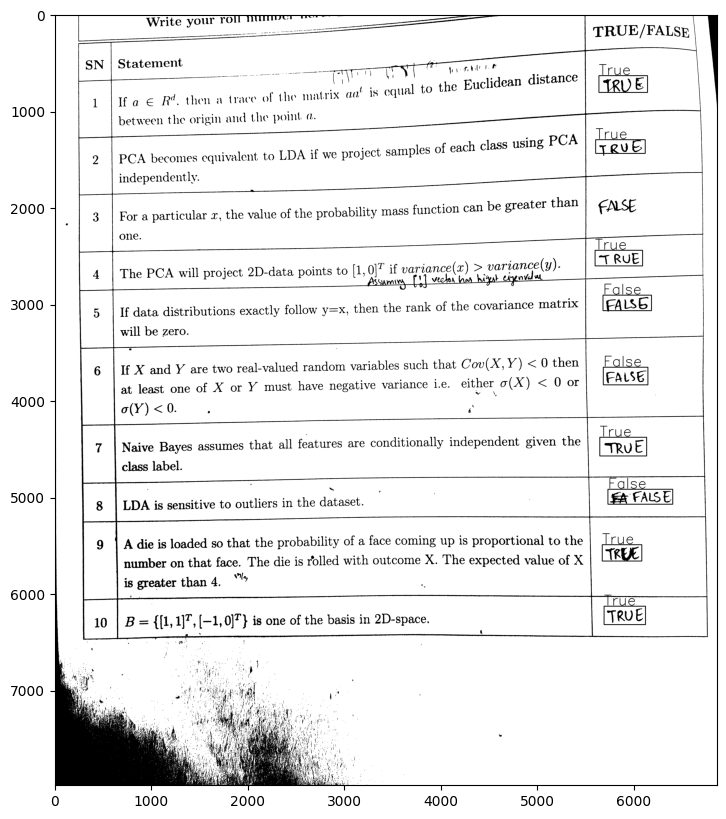

9 ['True', 'True', 'True', 'False', 'False', 'True', 'False', 'True', 'True']


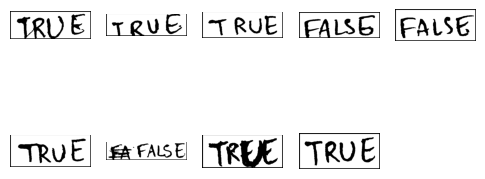

3
[2024/06/05 18:42:41] ppocr DEBUG: dt_boxes num : 46, elapsed : 0.054750919342041016
[2024/06/05 18:42:42] ppocr DEBUG: cls num  : 46, elapsed : 0.05403923988342285
[2024/06/05 18:42:42] ppocr DEBUG: rec_res num  : 46, elapsed : 0.2683079242706299


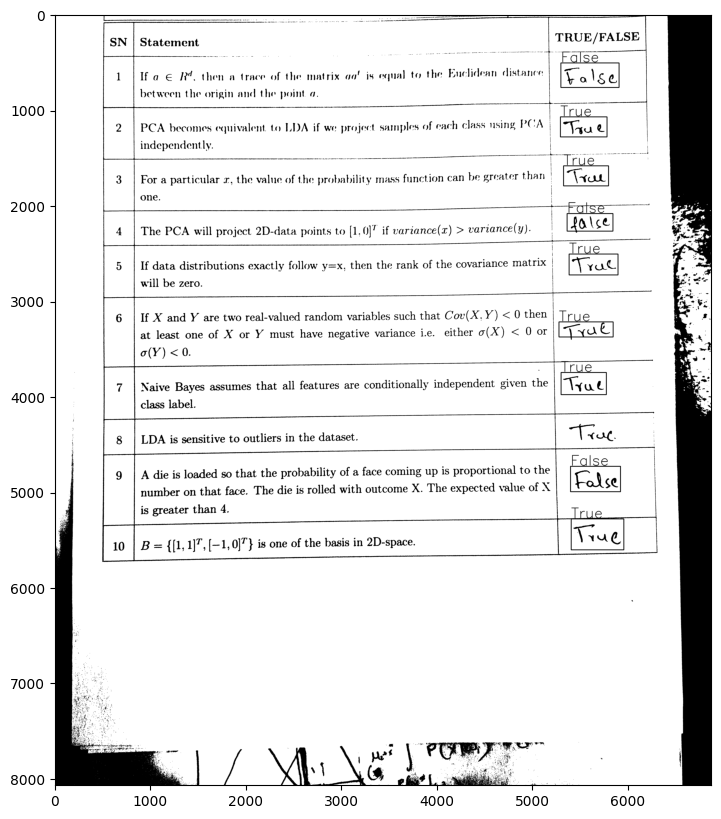

9 ['False', 'True', 'True', 'False', 'True', 'True', 'True', 'False', 'True']


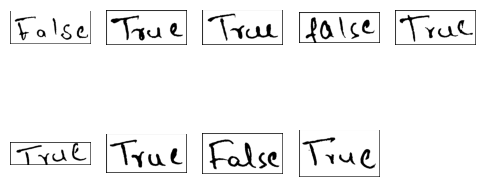

4
[2024/06/05 18:42:47] ppocr DEBUG: dt_boxes num : 41, elapsed : 0.04980325698852539
[2024/06/05 18:42:47] ppocr DEBUG: cls num  : 41, elapsed : 0.049515485763549805
[2024/06/05 18:42:47] ppocr DEBUG: rec_res num  : 41, elapsed : 0.24617242813110352


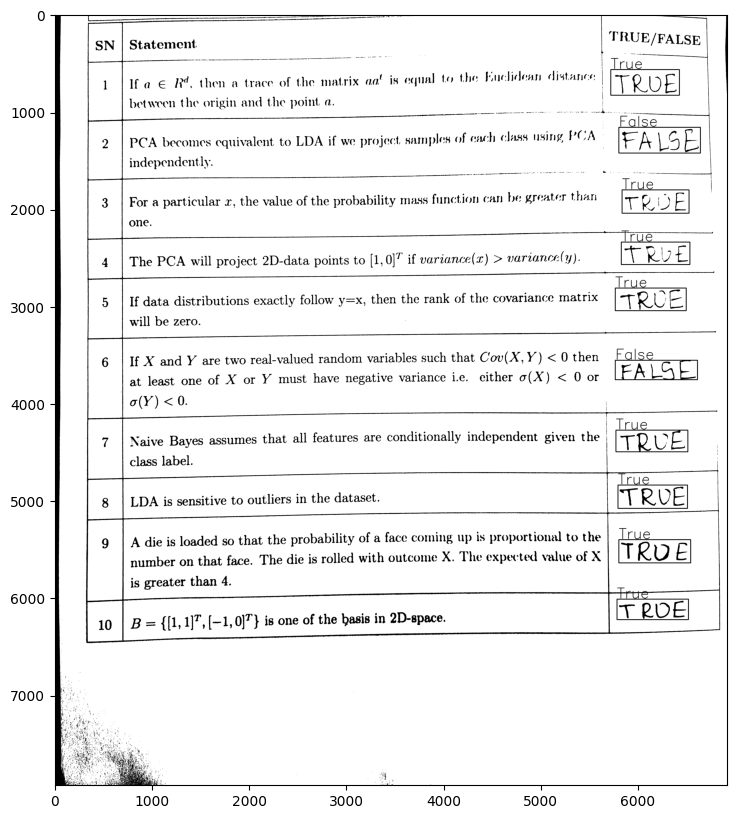

10 ['True', 'False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'True']


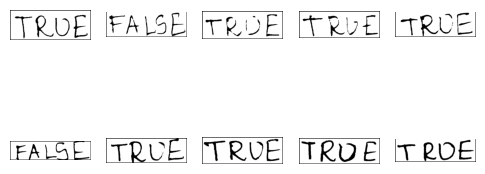

5
[2024/06/05 18:42:52] ppocr DEBUG: dt_boxes num : 44, elapsed : 0.08039164543151855
[2024/06/05 18:42:53] ppocr DEBUG: cls num  : 44, elapsed : 0.07309556007385254
[2024/06/05 18:42:53] ppocr DEBUG: rec_res num  : 44, elapsed : 0.2700974941253662


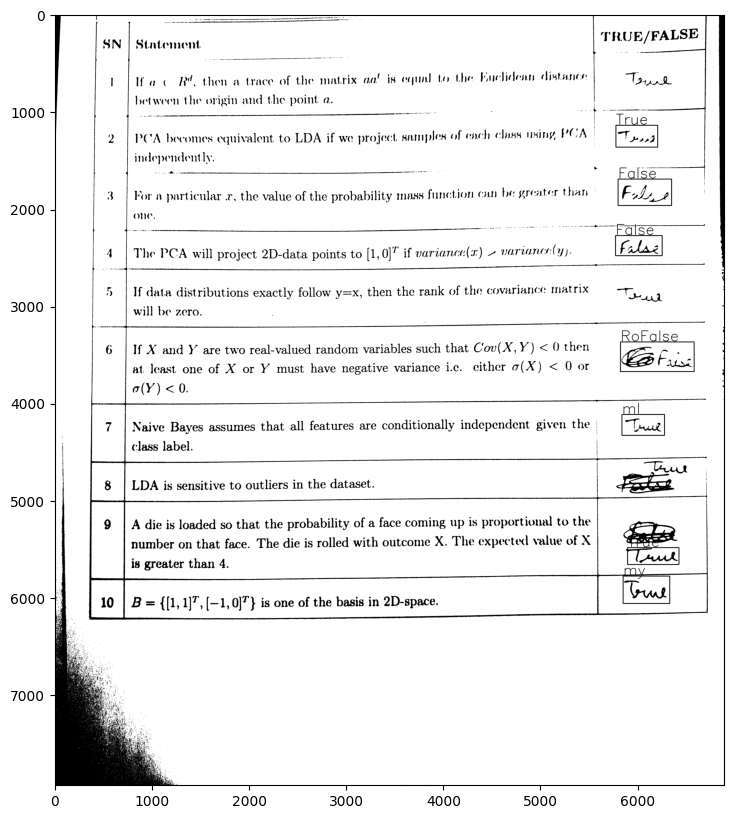

4 ['True', 'False', 'False', 'True']


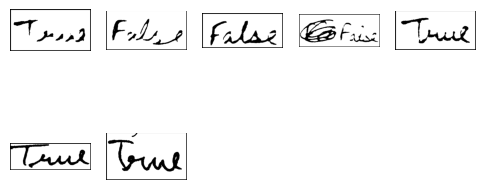

6
[2024/06/05 18:42:59] ppocr DEBUG: dt_boxes num : 39, elapsed : 0.051091909408569336
[2024/06/05 18:42:59] ppocr DEBUG: cls num  : 39, elapsed : 0.04809260368347168
[2024/06/05 18:42:59] ppocr DEBUG: rec_res num  : 39, elapsed : 0.21972370147705078


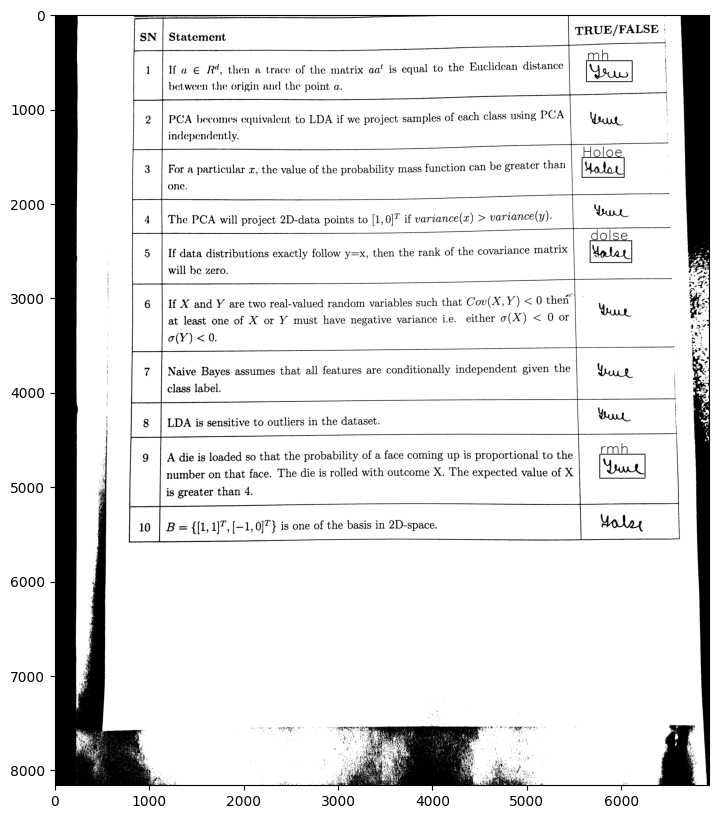

0 []


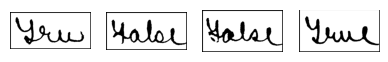

7
[2024/06/05 18:43:04] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.05148768424987793
[2024/06/05 18:43:04] ppocr DEBUG: cls num  : 42, elapsed : 0.05108523368835449
[2024/06/05 18:43:04] ppocr DEBUG: rec_res num  : 42, elapsed : 0.26839399337768555


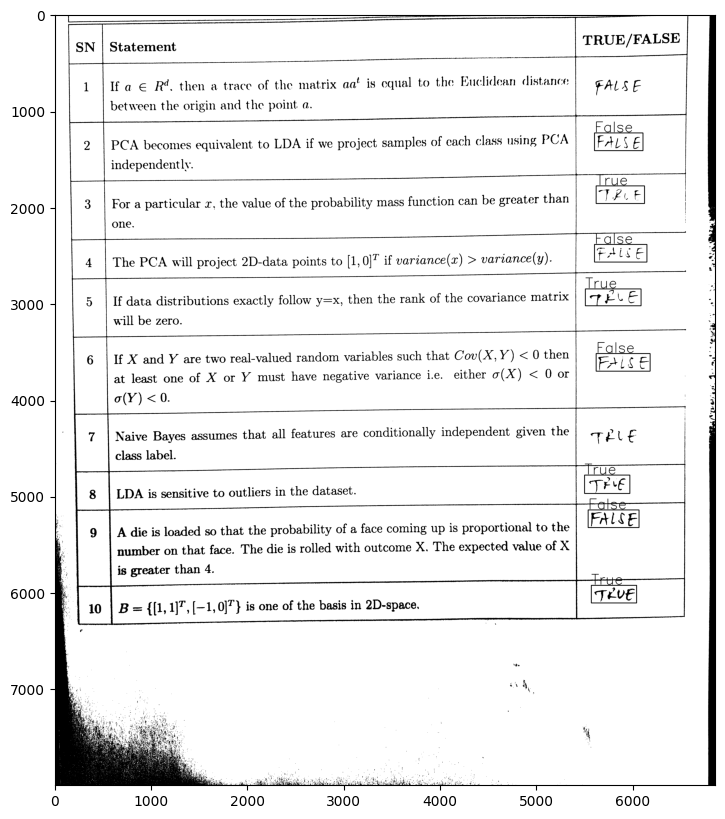

8 ['False', 'True', 'False', 'True', 'False', 'True', 'False', 'True']


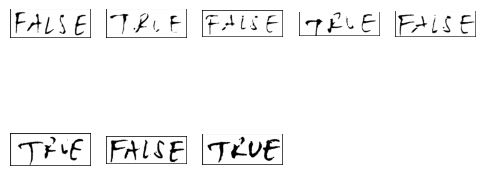

8
[2024/06/05 18:43:11] ppocr DEBUG: dt_boxes num : 44, elapsed : 0.05436968803405762
[2024/06/05 18:43:11] ppocr DEBUG: cls num  : 44, elapsed : 0.059895992279052734
[2024/06/05 18:43:11] ppocr DEBUG: rec_res num  : 44, elapsed : 0.2571578025817871


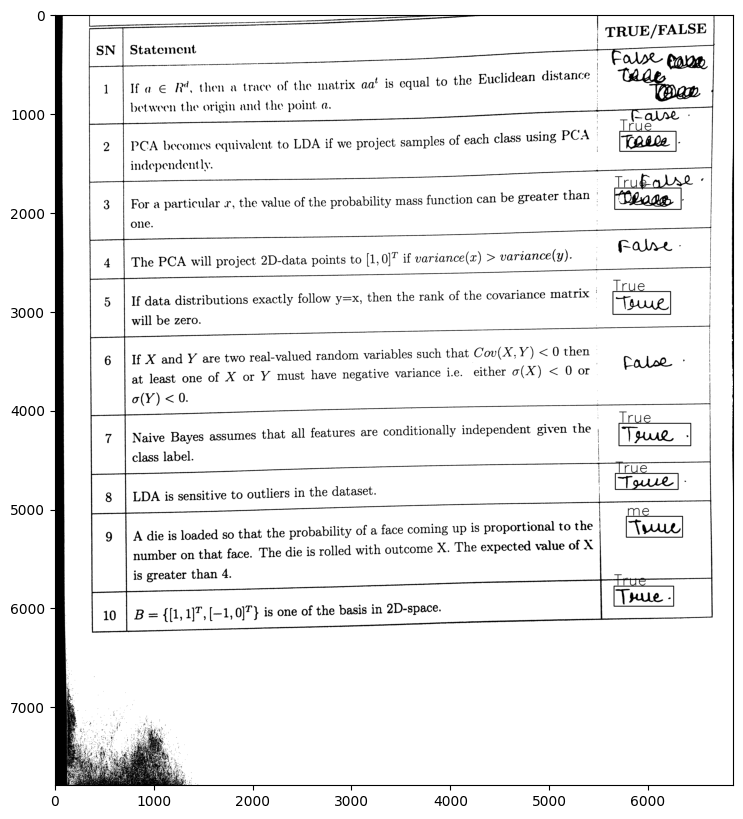

6 ['True', 'True', 'True', 'True', 'True', 'True']


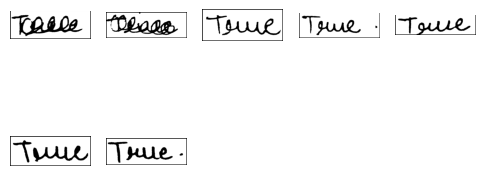

9
[2024/06/05 18:43:16] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.05250358581542969
[2024/06/05 18:43:16] ppocr DEBUG: cls num  : 42, elapsed : 0.05181288719177246
[2024/06/05 18:43:17] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2559502124786377


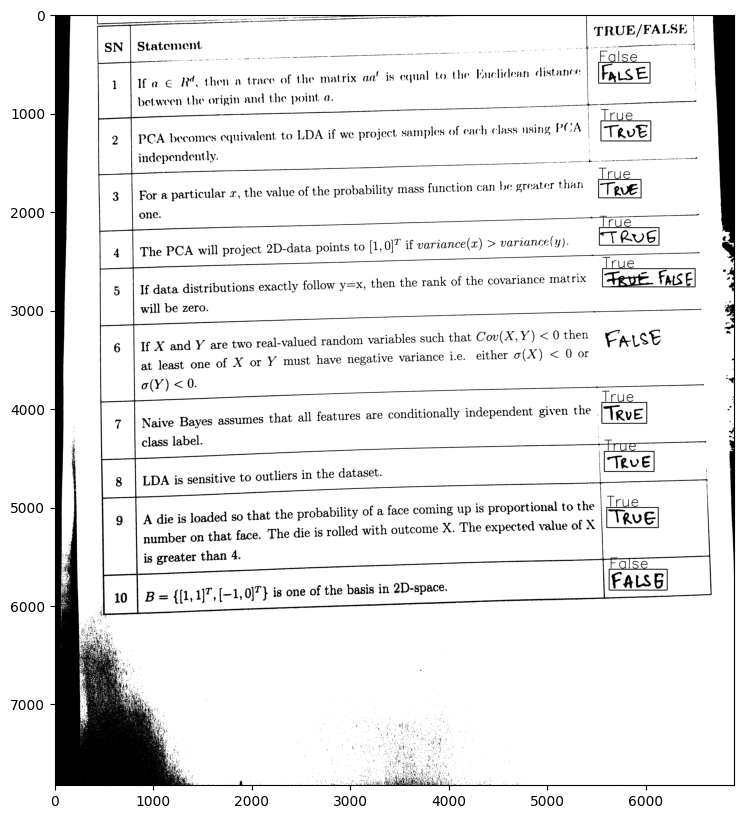

9 ['False', 'True', 'True', 'True', 'True', 'True', 'True', 'True', 'False']


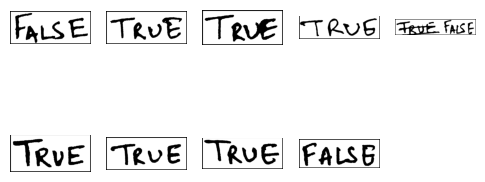

10
[2024/06/05 18:43:22] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.07301449775695801
[2024/06/05 18:43:22] ppocr DEBUG: cls num  : 42, elapsed : 0.07398581504821777
[2024/06/05 18:43:23] ppocr DEBUG: rec_res num  : 42, elapsed : 0.28861308097839355


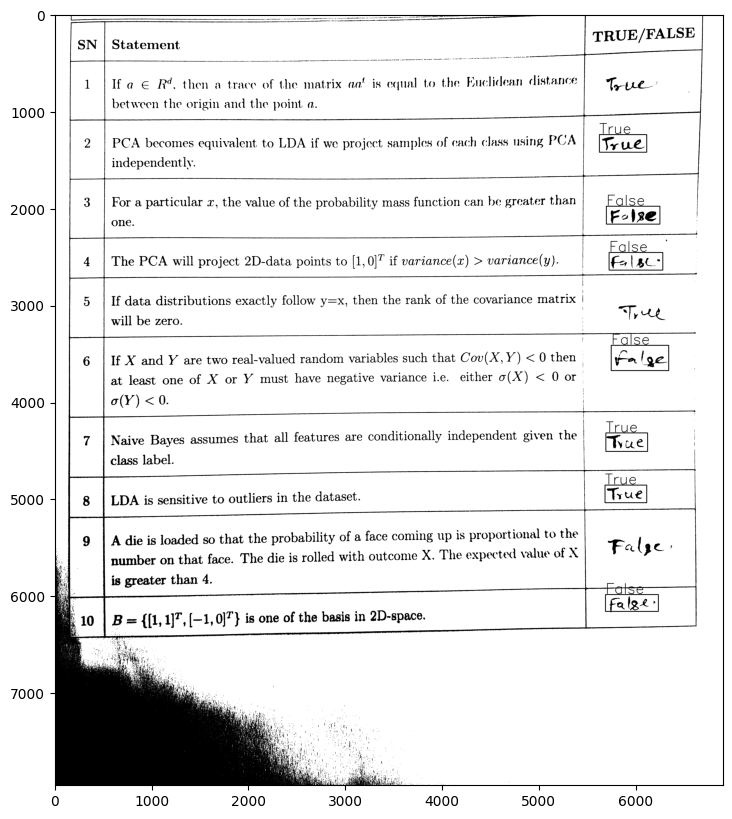

7 ['True', 'False', 'False', 'False', 'True', 'True', 'False']


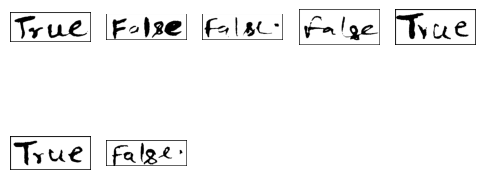

11
[2024/06/05 18:43:28] ppocr DEBUG: dt_boxes num : 40, elapsed : 0.05428314208984375
[2024/06/05 18:43:28] ppocr DEBUG: cls num  : 40, elapsed : 0.04917263984680176
[2024/06/05 18:43:28] ppocr DEBUG: rec_res num  : 40, elapsed : 0.26216673851013184


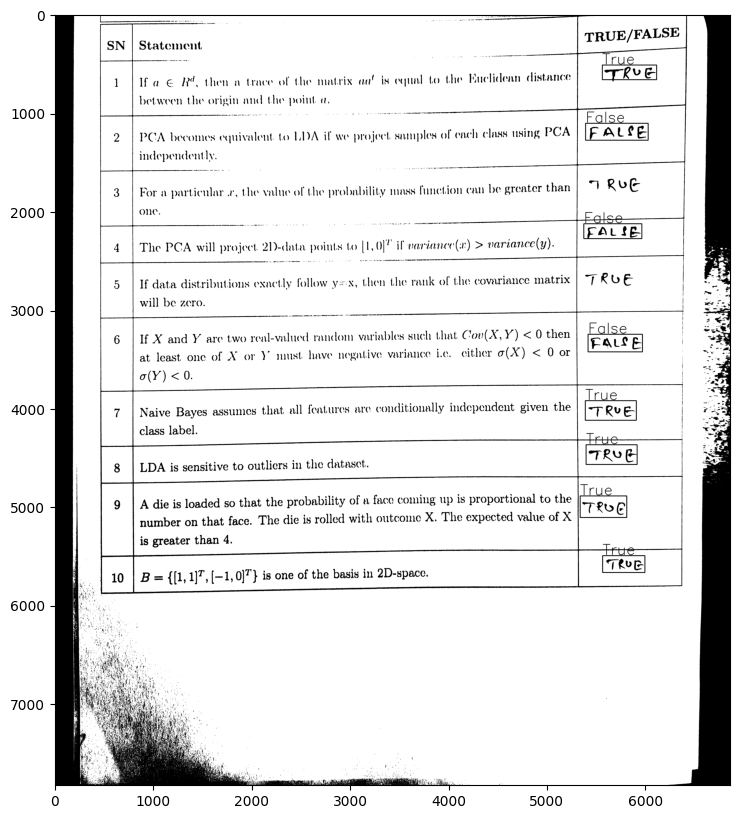

8 ['True', 'False', 'False', 'False', 'True', 'True', 'True', 'True']


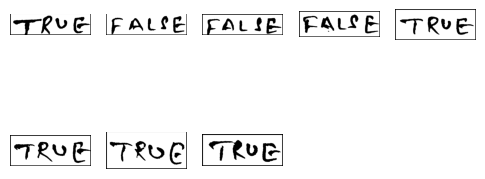

12
[2024/06/05 18:43:33] ppocr DEBUG: dt_boxes num : 34, elapsed : 0.04832339286804199
[2024/06/05 18:43:33] ppocr DEBUG: cls num  : 34, elapsed : 0.0522618293762207
[2024/06/05 18:43:34] ppocr DEBUG: rec_res num  : 34, elapsed : 0.2505683898925781


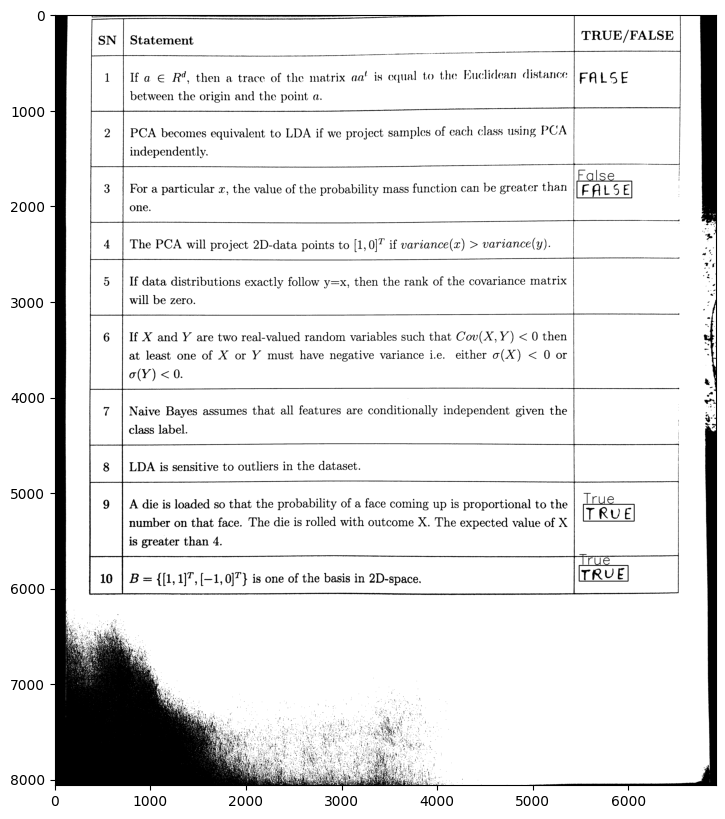

3 ['False', 'True', 'True']


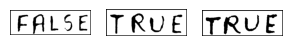

13
[2024/06/05 18:43:40] ppocr DEBUG: dt_boxes num : 39, elapsed : 0.051219940185546875
[2024/06/05 18:43:40] ppocr DEBUG: cls num  : 39, elapsed : 0.05156683921813965
[2024/06/05 18:43:41] ppocr DEBUG: rec_res num  : 39, elapsed : 0.24063706398010254


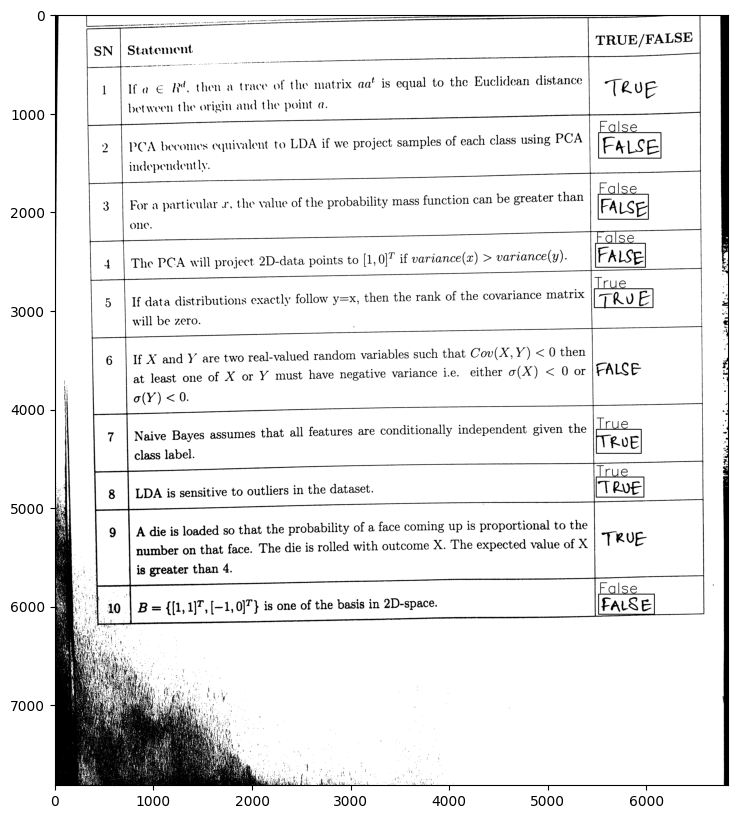

7 ['False', 'False', 'False', 'True', 'True', 'True', 'False']


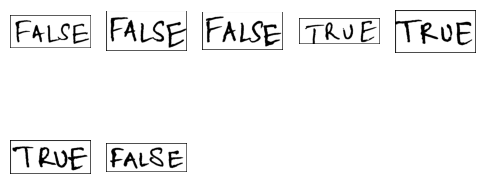

14
[2024/06/05 18:43:45] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.051044464111328125
[2024/06/05 18:43:46] ppocr DEBUG: cls num  : 42, elapsed : 0.04812741279602051
[2024/06/05 18:43:46] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2715034484863281


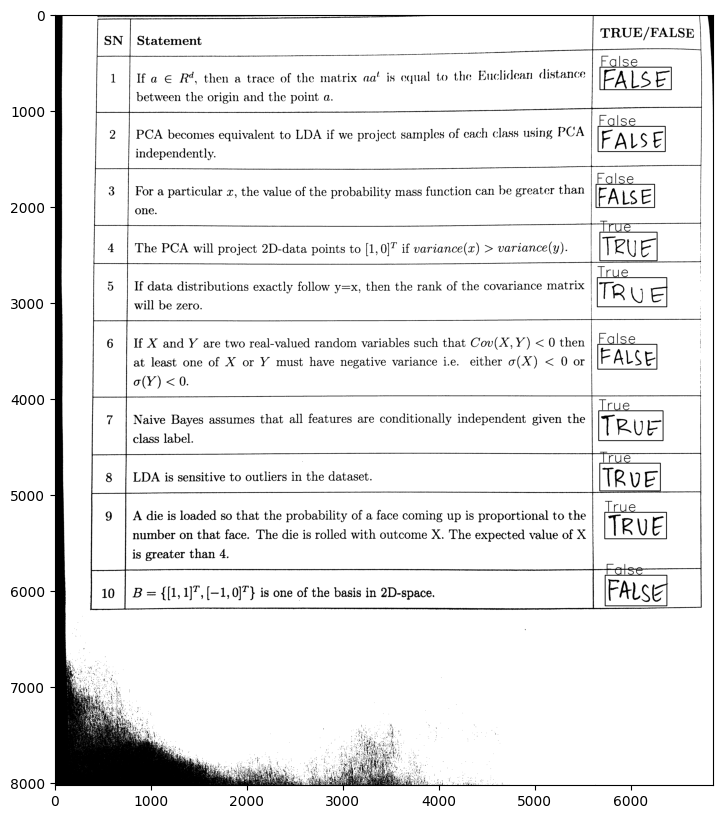

10 ['False', 'False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


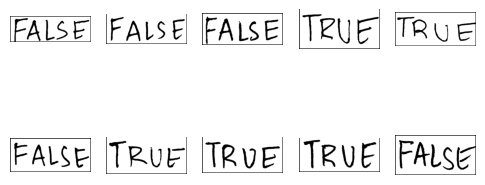

15
[2024/06/05 18:43:51] ppocr DEBUG: dt_boxes num : 45, elapsed : 0.08153653144836426
[2024/06/05 18:43:52] ppocr DEBUG: cls num  : 45, elapsed : 0.09986281394958496
[2024/06/05 18:43:53] ppocr DEBUG: rec_res num  : 45, elapsed : 0.3039877414703369


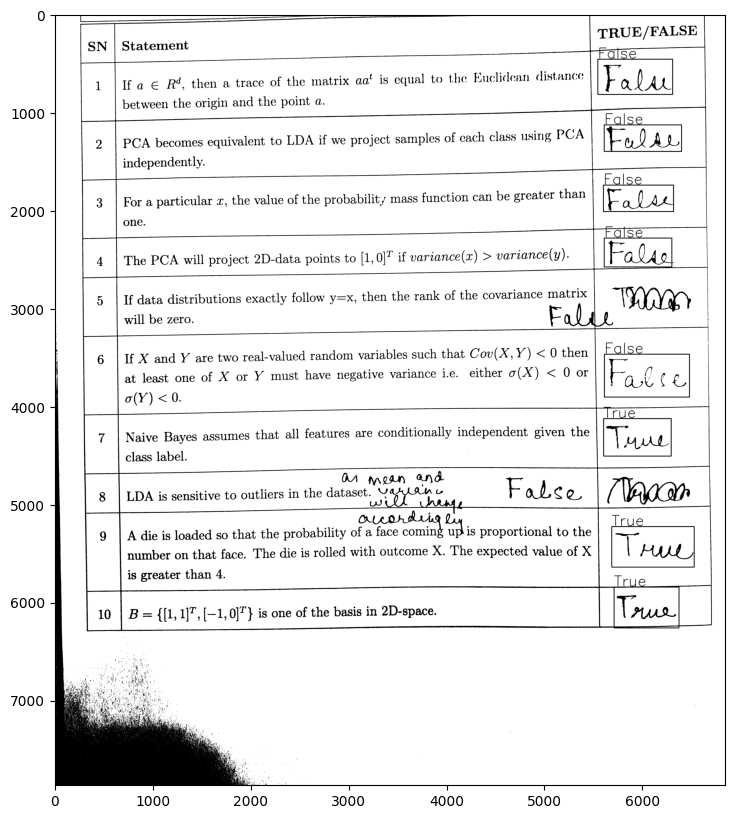

8 ['False', 'False', 'False', 'False', 'False', 'True', 'True', 'True']


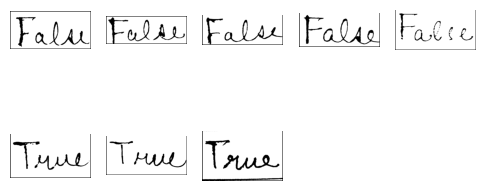

16
[2024/06/05 18:43:57] ppocr DEBUG: dt_boxes num : 39, elapsed : 0.05174398422241211
[2024/06/05 18:43:58] ppocr DEBUG: cls num  : 39, elapsed : 0.04573392868041992
[2024/06/05 18:43:58] ppocr DEBUG: rec_res num  : 39, elapsed : 0.25121617317199707


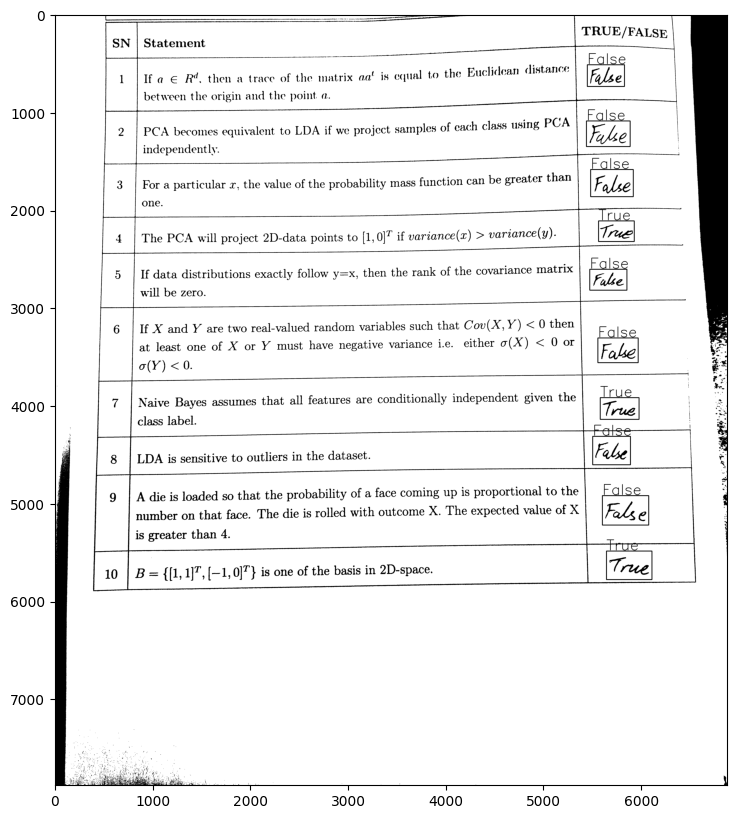

10 ['False', 'False', 'False', 'True', 'False', 'False', 'True', 'False', 'False', 'True']


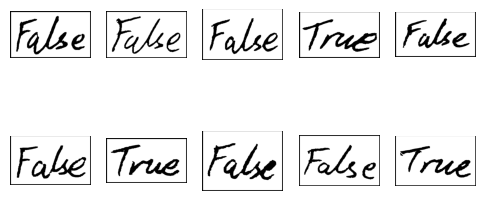

17
[2024/06/05 18:44:03] ppocr DEBUG: dt_boxes num : 41, elapsed : 0.0564723014831543
[2024/06/05 18:44:03] ppocr DEBUG: cls num  : 41, elapsed : 0.04593849182128906
[2024/06/05 18:44:03] ppocr DEBUG: rec_res num  : 41, elapsed : 0.28929567337036133


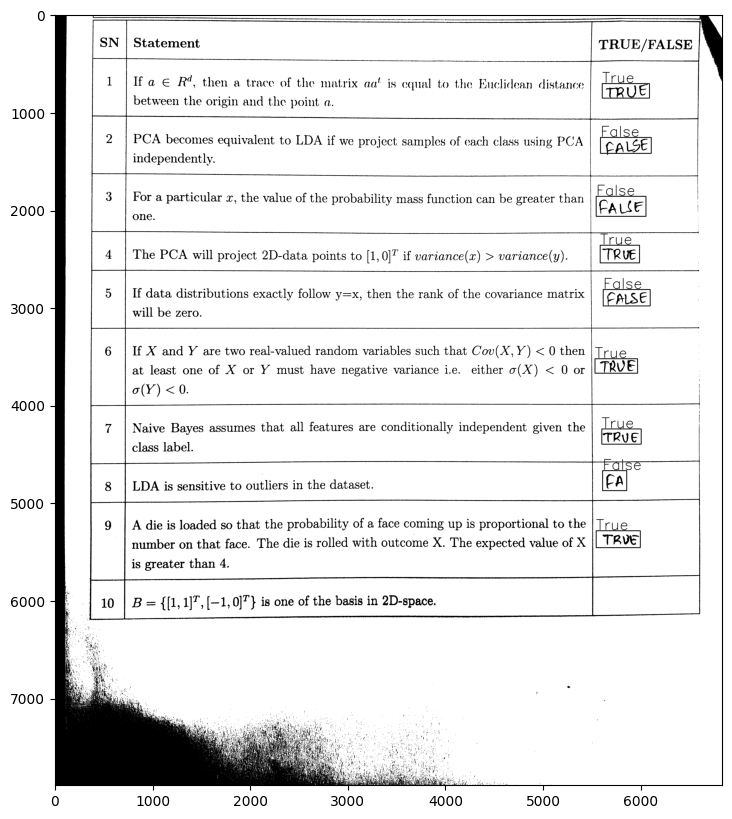

9 ['True', 'False', 'False', 'True', 'False', 'True', 'True', 'False', 'True']


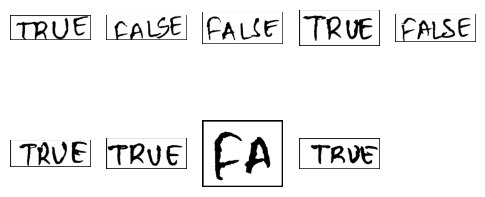

18
[2024/06/05 18:44:10] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.05087113380432129
[2024/06/05 18:44:10] ppocr DEBUG: cls num  : 42, elapsed : 0.05645465850830078
[2024/06/05 18:44:10] ppocr DEBUG: rec_res num  : 42, elapsed : 0.24994182586669922


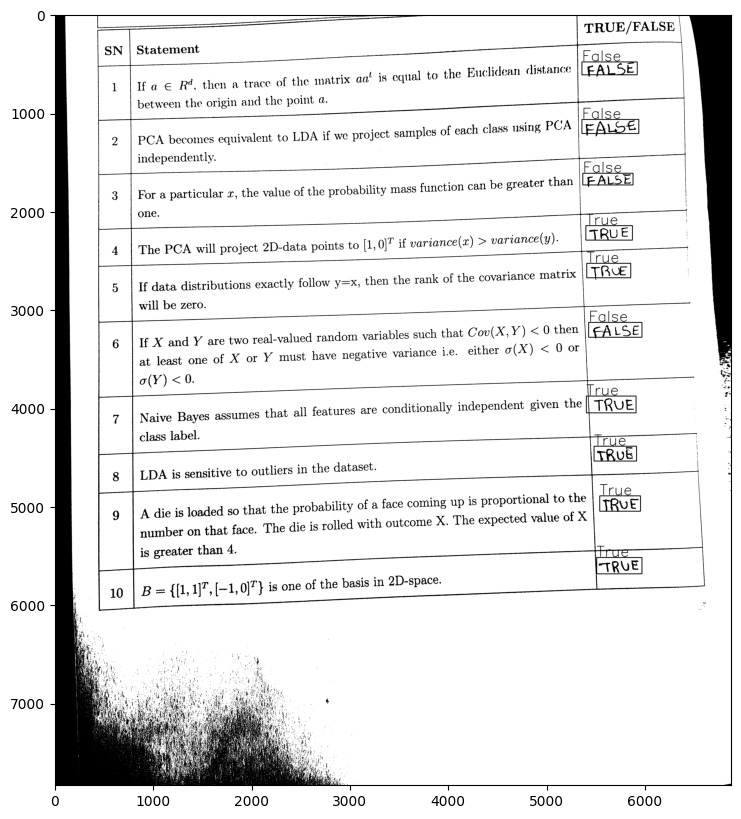

10 ['False', 'False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'True']


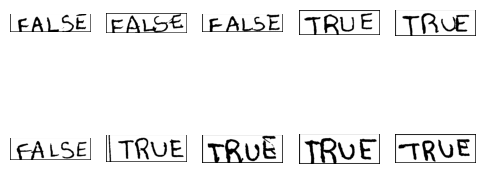

19
[2024/06/05 18:44:15] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.05247688293457031
[2024/06/05 18:44:15] ppocr DEBUG: cls num  : 42, elapsed : 0.048145294189453125
[2024/06/05 18:44:15] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2312772274017334


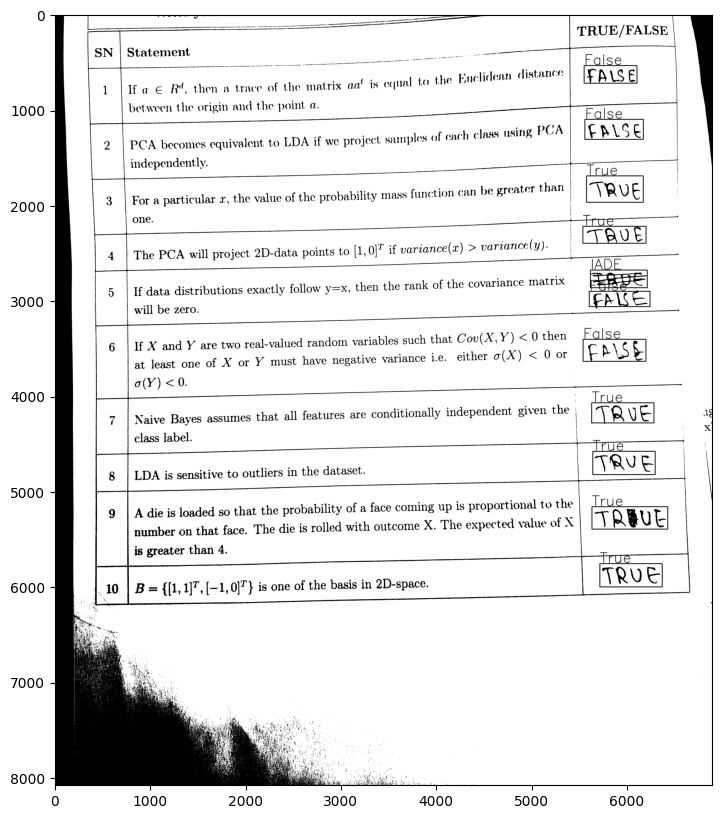

10 ['False', 'False', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'True']


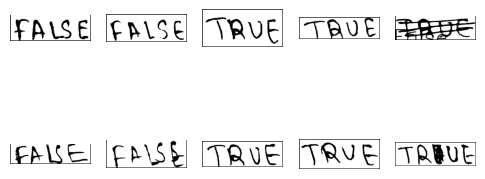

20
[2024/06/05 18:44:22] ppocr DEBUG: dt_boxes num : 41, elapsed : 0.04993438720703125
[2024/06/05 18:44:22] ppocr DEBUG: cls num  : 41, elapsed : 0.058959007263183594
[2024/06/05 18:44:23] ppocr DEBUG: rec_res num  : 41, elapsed : 0.2505066394805908


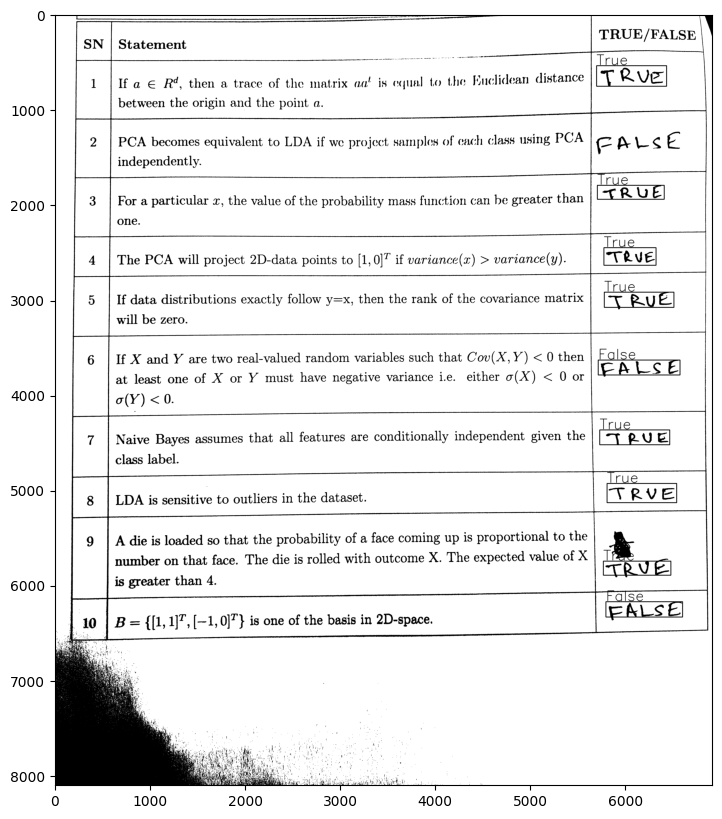

9 ['True', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


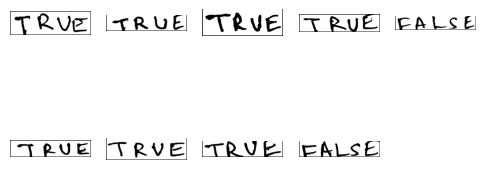

21
[2024/06/05 18:44:27] ppocr DEBUG: dt_boxes num : 40, elapsed : 0.05149245262145996
[2024/06/05 18:44:28] ppocr DEBUG: cls num  : 40, elapsed : 0.05215144157409668
[2024/06/05 18:44:28] ppocr DEBUG: rec_res num  : 40, elapsed : 0.23611974716186523


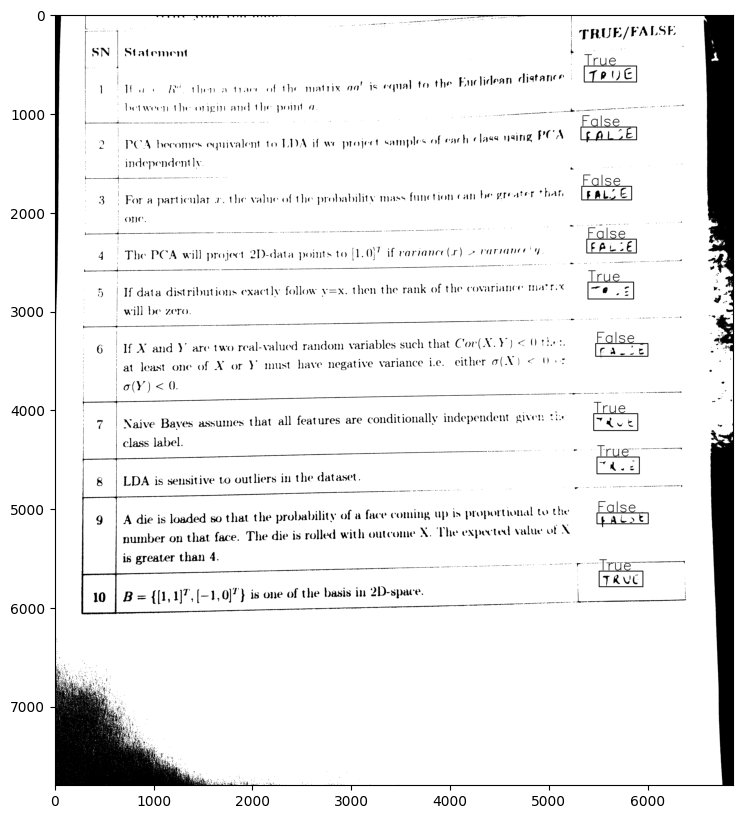

10 ['True', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'False', 'True']


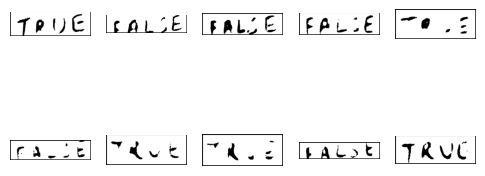

22
[2024/06/05 18:44:33] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.07378077507019043
[2024/06/05 18:44:34] ppocr DEBUG: cls num  : 42, elapsed : 0.060578346252441406
[2024/06/05 18:44:34] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2804877758026123


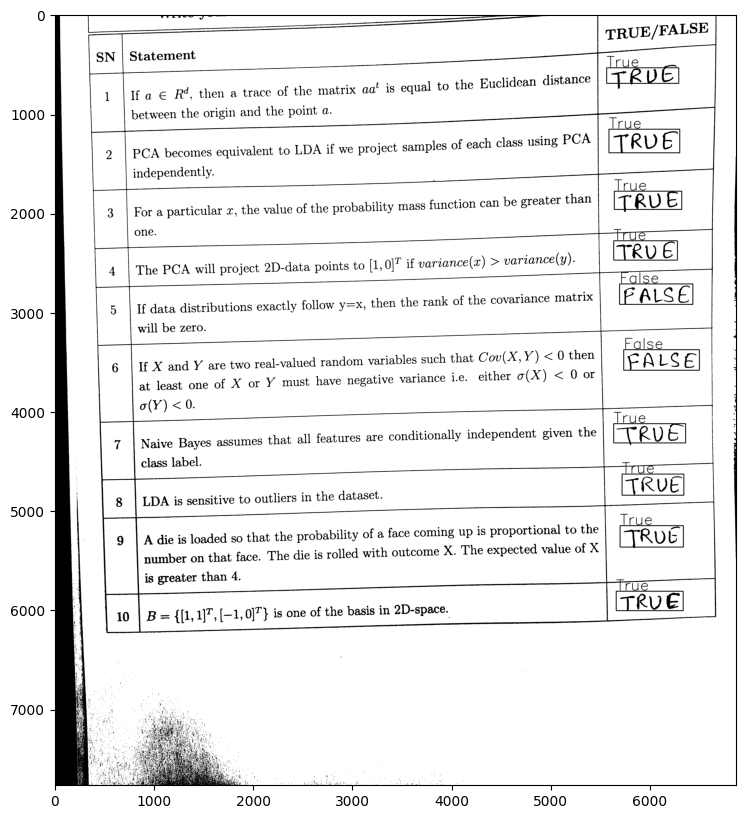

10 ['True', 'True', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'True']


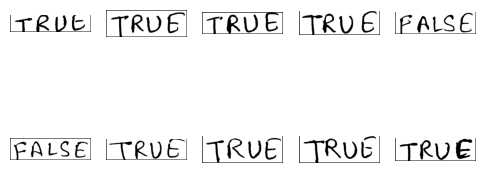

23
[2024/06/05 18:44:40] ppocr DEBUG: dt_boxes num : 39, elapsed : 0.049422264099121094
[2024/06/05 18:44:40] ppocr DEBUG: cls num  : 39, elapsed : 0.04900670051574707
[2024/06/05 18:44:40] ppocr DEBUG: rec_res num  : 39, elapsed : 0.24736404418945312


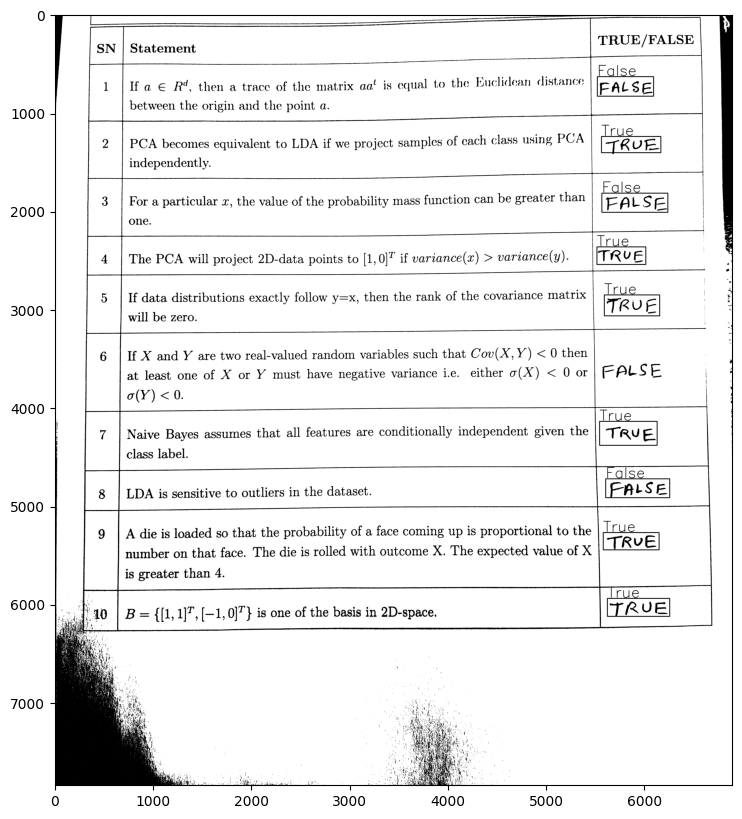

9 ['False', 'True', 'False', 'True', 'True', 'True', 'False', 'True', 'True']


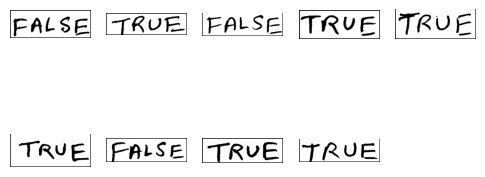

24
[2024/06/05 18:44:45] ppocr DEBUG: dt_boxes num : 42, elapsed : 0.049043893814086914
[2024/06/05 18:44:45] ppocr DEBUG: cls num  : 42, elapsed : 0.04743623733520508
[2024/06/05 18:44:46] ppocr DEBUG: rec_res num  : 42, elapsed : 0.2729482650756836


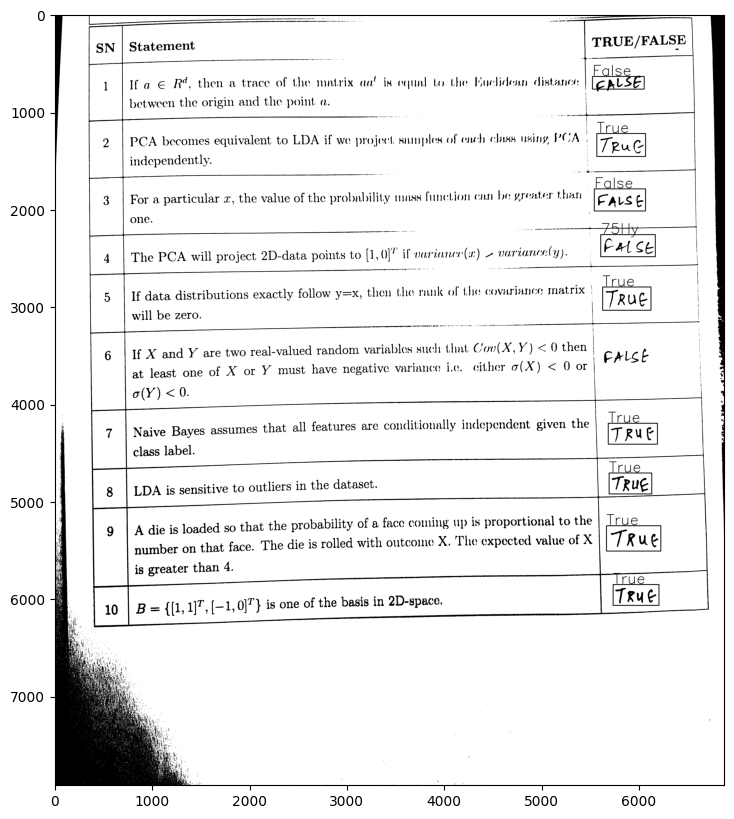

8 ['False', 'True', 'False', 'True', 'True', 'True', 'True', 'True']


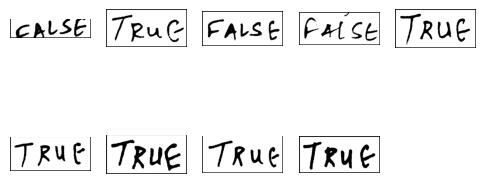

25
[2024/06/05 18:44:52] ppocr DEBUG: dt_boxes num : 43, elapsed : 0.05038022994995117
[2024/06/05 18:44:52] ppocr DEBUG: cls num  : 43, elapsed : 0.05534982681274414
[2024/06/05 18:44:52] ppocr DEBUG: rec_res num  : 43, elapsed : 0.24950528144836426


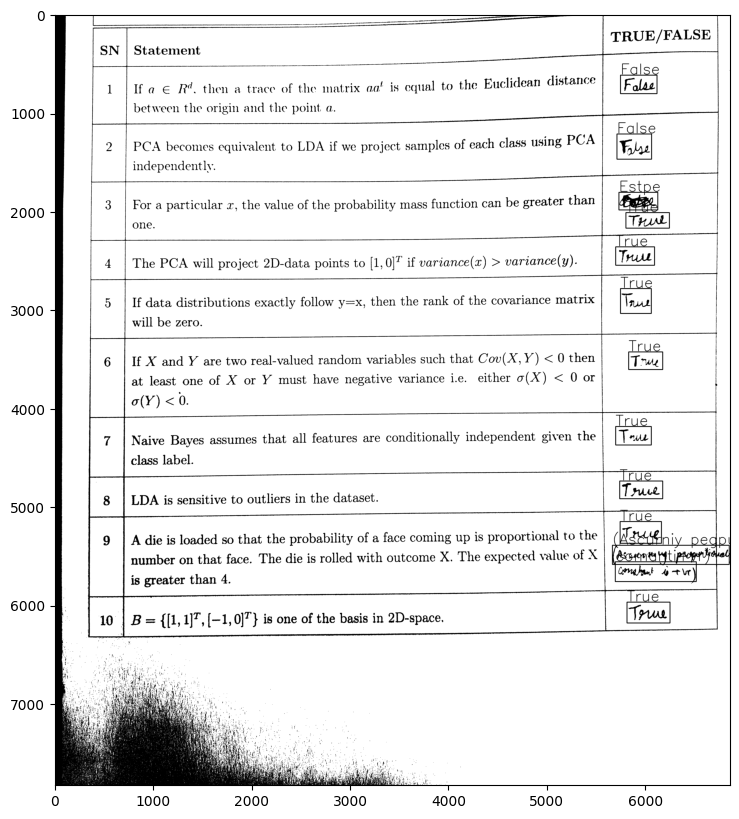

10 ['False', 'False', 'True', 'True', 'True', 'True', 'True', 'True', 'True', 'True']


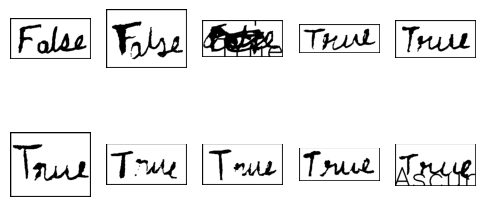

26
[2024/06/05 18:44:58] ppocr DEBUG: dt_boxes num : 43, elapsed : 0.07984566688537598
[2024/06/05 18:44:59] ppocr DEBUG: cls num  : 43, elapsed : 0.0875239372253418
[2024/06/05 18:44:59] ppocr DEBUG: rec_res num  : 43, elapsed : 0.28476953506469727


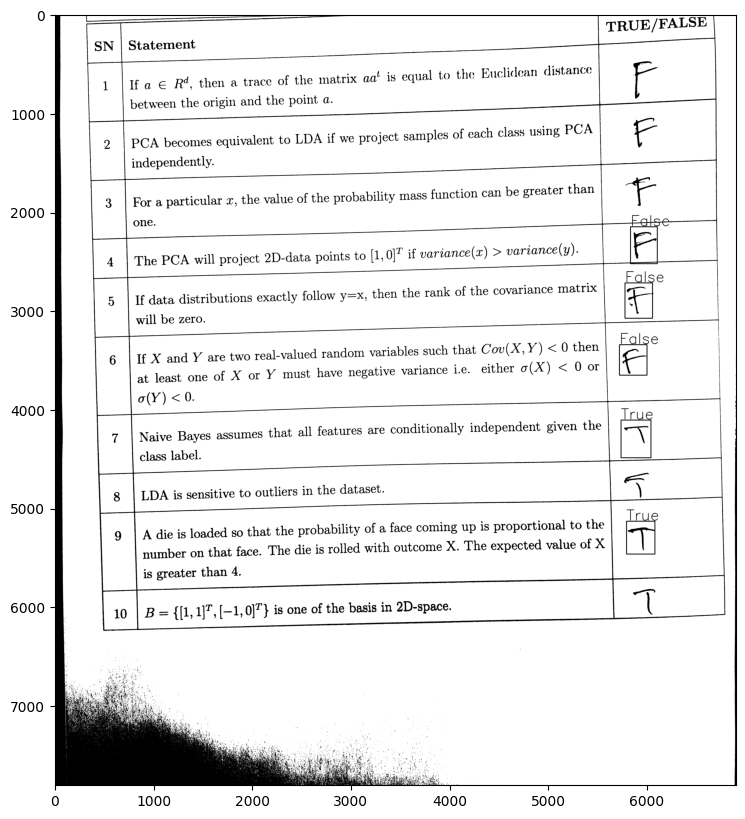

5 ['False', 'False', 'False', 'True', 'True']


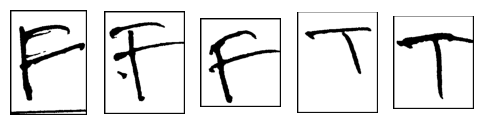

27
[2024/06/05 18:45:05] ppocr DEBUG: dt_boxes num : 40, elapsed : 0.050028085708618164
[2024/06/05 18:45:06] ppocr DEBUG: cls num  : 40, elapsed : 0.04999494552612305
[2024/06/05 18:45:06] ppocr DEBUG: rec_res num  : 40, elapsed : 0.25432419776916504


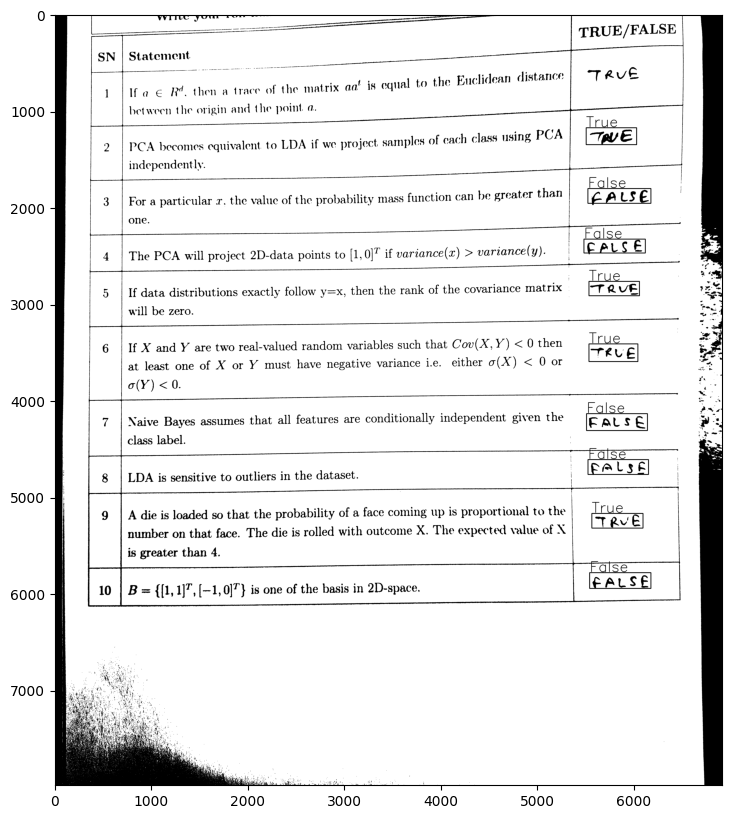

9 ['True', 'False', 'False', 'True', 'True', 'False', 'False', 'True', 'False']


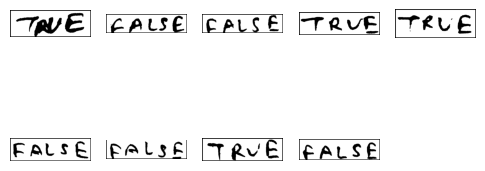

28
[2024/06/05 18:45:11] ppocr DEBUG: dt_boxes num : 41, elapsed : 0.05106353759765625
[2024/06/05 18:45:11] ppocr DEBUG: cls num  : 41, elapsed : 0.048137664794921875
[2024/06/05 18:45:11] ppocr DEBUG: rec_res num  : 41, elapsed : 0.25728511810302734


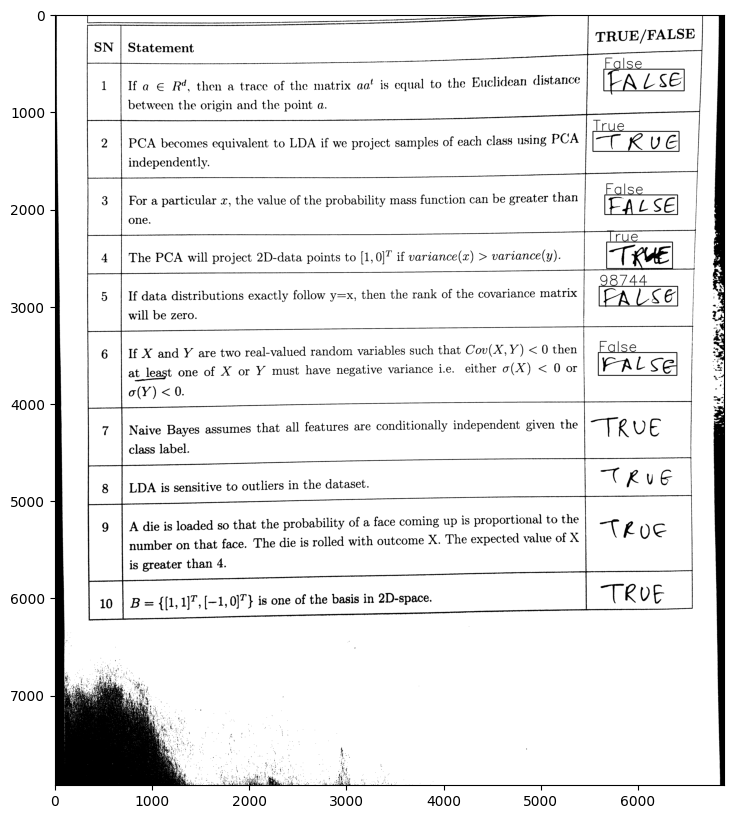

5 ['False', 'True', 'False', 'True', 'False']


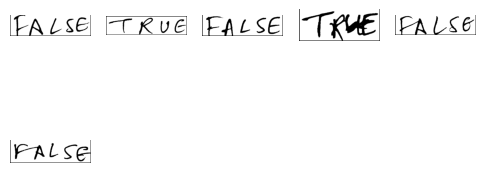

In [27]:
all_answers_images=[]
all_answers_text=[]
full_images=[]
for i in range(len(imgs)):
    image=imgs[i];
    path=arr[i];
    print(i+1)
    img,cur,text=extract_tf(image,path)
    all_answers_text.append(text)
    full_images.append(img)
    all_answers_images.append(cur)
    plt.figure(figsize=(10,10))
    plt.imshow(img,cmap='gray')
    plt.show()
    print(len(text),text)
    display_images(cur)

In [10]:

# Get the entire text as a list
all_text_Str = ' '.join(map(str, txts))

with open('/content/PaddleOCR_Output_Text.txt', 'w', encoding='utf8') as file:
  file.write(all_text_Str)

In [28]:
df=pd.DataFrame(all_answers_text)
df

,0,1,2,3,4,5,6,7,8,9
0,True,True,True,True,True,False,True,True,False,True
1,True,True,True,False,False,True,False,True,True,None
2,False,True,True,False,True,True,True,False,True,None
3,True,False,True,True,True,False,True,True,True,True
4,True,False,False,True,None,None,None,None,None,None
5,None,None,None,None,None,None,None,None,None,None
6,False,True,False,True,False,True,False,True,None,None
7,True,True,True,True,True,True,None,None,None,None
8,False,True,True,True,True,True,True,True,False,None
9,True,False,False,False,True,True,False,None,None,None
